In [23]:
%pylab inline

import gc
import os
import smatch
import pandas
import detect3D
import matplotlib
import astropy.io.fits as pyfits
import astropy.io.ascii as ascii
from astropy.table import Table,join,vstack
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display')

import maputil as mapUtil
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

pDict={'dempz': 'demp',\
       'dnnz': 'dnn',\
       'mizuki': 'mizuki'}

figMsDir='/home/xiangchong/Documents/Docs/massMap/2-cluster_HSC_2021/'

nsim=200
key='dempz'
colname=pDict[key]
glab='test'
fieldname='XMM'
pzDir=os.path.join('datDir/catalog_tracts/','%s_tracts/' %fieldname)
configName  =   'wrkDir/config-nl10.ini'
parser      =   ConfigParser()
parser.read(configName)
catDir=   'wrkDir/test/'
outDir=   'wrkDir/test/out2'
mockDir=  'wrkDir/test/mock/'
if not os.path.isdir(mockDir):
    os.mkdir(mockDir)
    
fnameT=os.path.join(catDir,'%s.fits' %fieldname)
fname=os.path.join(catDir,'src.fits')
g1fname=os.path.join(catDir,'g1Map-%s.fits' %(key))
g2fname=os.path.join(catDir,'g2Map-%s.fits' %(key))
stdfname=os.path.join(catDir,'stdMap-%s.fits' %(key))
lenskerfname=os.path.join(outDir,'lensker-%s-10bins.fits' %key)

Populating the interactive namespace from numpy and matplotlib


/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['vstack']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


# prepare Catalog
## main catalog

In [2]:
if False:
    data=pyfits.getdata(fnameT)
    raMin=32.5;raMax=33.5
    decMin=-4;decMax=-3.
    mask=(data['ra']>raMin)&(data['ra']<raMax)
    mask&=(data['dec']>decMin)&(data['dec']<decMax)
    data=data[mask]
    pyfits.writeto(fname,data,overwrite=True)
    
if False:
    data=Table.read(fname)
    ids=data['Id',]
    ids.rename_column('Id','ID')
    tracts=list(set(data['tract']))
    print(tracts)
    pzAll=[]
    for tract in tracts:
        pfname=os.path.join(pzDir,'%s_pz_pdf_%s.fits' %(tract,key))
        pzs=Table.read(pfname)
        pzAll.append(join(left=ids,right=pzs,keys='ID',join_type='inner'))
        del pzs,pfname
        gc.collect()
    pzAll=vstack(pzAll)
    pzAll.sort('ID')
    assert np.all(data['Id']==pzAll['ID'])
    del ids,tracts,data
    gn=fname.split('-')[-1].split('.')[0]
    ofname=os.path.join(catDir,'poz-%s.fits' %(key))
    pzAll.write(ofname,overwrite=True)
    del pzAll
    gc.collect()

## mock catalogs

In [3]:
if False:
    data=pyfits.getdata(fname)
    nobj=len(data)
    for i in range(nsim):
        catMock   =  data.copy()
        np.random.seed(i)
        phi = 2.0 * np.pi * np.random.rand(nobj)
        g1n,g2n   =   mapUtil.rotCatalog(data['g1'],data['g2'],phi)
        catMock['g1']=g1n
        catMock['g2']=g2n
        pyfits.writeto(os.path.join(mockDir,'src-%d.fits' %i),catMock,overwrite=True)
        del catMock
        gc.collect()

# poz and lensing kernel

In [4]:
nz=10
pzDir=os.path.join('datDir/catalog_tracts/','XMM_tracts/')
pbins= pyfits.getdata(os.path.join(pzDir,'8522_pz_pdf_%s.fits' %key),ext=2)['BINS']
nbin=len(pbins)

data=pyfits.getdata(fname)
# poz average
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)
poz_best=data['%s_zbest'%colname]
poz_best=poz_best[mask]
bounds=np.percentile(poz_best,np.linspace(0,100,nz+1))

pfname=os.path.join(catDir,'poz-%s.fits' %key)
pata=pyfits.getdata(pfname)
pata=pata[mask]
poz_ave=np.zeros((nz,nbin))
for iz in range(nz):
    tmp_msk=(poz_best>=bounds[iz])&(poz_best<bounds[iz+1])
    poz_ave[iz]=np.average(pata['PDF'][tmp_msk],axis=0)
out=pyfits.HDUList([pyfits.PrimaryHDU(poz_ave),\
pyfits.BinTableHDU.from_columns([pyfits.Column(name='zbounds',array=bounds,format='D')])])
outname1=os.path.join(catDir,'poz-%s-10bins.fits' %(key))
out.writeto(outname1,overwrite=True)
del data,pata,out
gc.collect()
outname2=os.path.join(catDir,'pozave-%s-10bins.png' %(key))
mapUtil.plotPozAve(glab,pbins,poz_ave,outname2)

In [5]:
# configuration
parser      =   ConfigParser()
parser.read(configName)
parser.set('sourceZ','zbound','[%s]' %(','.join([str(bb) for bb in bounds])))
gridInfo    =   cartesianGrid3D(parser)

In [6]:
# lensing kernel
lensKer1= gridInfo.lensing_kernel()
lensKer2= gridInfo.lensing_kernel(poz_grids=pbins,poz_ave=poz_ave,deltaIn=False)
#lensKer2= gridInfo.lensing_kernel(poz_grids=pbins,poz_ave=poz_ave)
out=pyfits.HDUList([pyfits.PrimaryHDU(lensKer2),pyfits.ImageHDU(lensKer1)])
out.writeto(lenskerfname,overwrite=True)
pltname=os.path.join(outDir,'lensker-%s-10bins.png' %key)
mapUtil.plotLensKernel(glab,gridInfo.zcgrid,lensKer1,lensKer2,pltname)

# Pixelization
## main catalog

In [7]:
# poz average
data=pyfits.getdata(fname)
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)
data=data[mask]
wsAve=np.average(data['weight'])
ws=data['weight']/wsAve
z=data['%s_zbest'%colname]
x,y=gridInfo.setupTanPlane(data['ra'],data['dec'])
out1=gridInfo.pixelize_data(x,y,z,data['g1'],ws=ws)
out2=gridInfo.pixelize_data(x,y,z,data['g2'],ws=ws)
pyfits.writeto(g1fname,out1,overwrite=True)
pyfits.writeto(g2fname,out2,overwrite=True)
outname3=os.path.join(catDir,'g1Hist-%s.png' %(key))
mapUtil.plotHist(glab,data['g1'],out1[out1!=0],outname3)
del out1,out2,data,bounds,x,y,z,ws
gc.collect()

16053

## mock catalogs

In [8]:
data=pyfits.getdata(fname)
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)
data=data[mask]
wsAve=np.average(data['weight'])
ws=data['weight']/wsAve
z=data['%s_zbest'%colname]
x,y=gridInfo.setupTanPlane(data['ra'],data['dec'])
del data
gc.collect()
gStd=np.zeros(gridInfo.shape)
for i in range(nsim):
    fname2=os.path.join(mockDir,'src-%s.fits' %i)
    data=pyfits.getdata(fname2)[mask]
    out1=gridInfo.pixelize_data(x,y,z,data['g1'],ws=ws)
    out2=gridInfo.pixelize_data(x,y,z,data['g2'],ws=ws)
    outname1=os.path.join(mockDir,'g1Map-%s-%s.fits' %(key,i))
    outname2=os.path.join(mockDir,'g2Map-%s-%s.fits' %(key,i))
    pyfits.writeto(outname1,out1,overwrite=True)
    pyfits.writeto(outname2,out2,overwrite=True)
    gStd+=(out1)**2.
    gStd+=(out2)**2.
    del out1,out2,data,fname2
    gc.collect() 
gStd/=nsim
gStd=np.sqrt(gStd)
pyfits.writeto(stdfname,gStd,overwrite=True)

# reconstruction
## prepare

In [8]:
assert os.path.isfile(g1fname)
assert os.path.isfile(g2fname)
assert os.path.isfile(stdfname)
assert os.path.isfile(lenskerfname)

# configuration
parser.set('prepare','g1fname',g1fname)
parser.set('prepare','g2fname',g2fname)
parser.set('prepare','sigmafname',stdfname)
parser.set('prepare','lkfname',lenskerfname)

parser.set('lensZ','resolve_lim','.5')
parser.set('lensZ','rs_base','.12')
#parser.set('lensZ','rs_base','0.')    #Mpc/h

# Reconstruction Init
lbd=2.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','lcd','0')

parser.set('lensZ','atomFname','wrkDir/prior/haloBasis-nl10.fits')
parser.set('sparse','nframe','1' )
parser.set('sparse','mu','4e-4')

a=pyfits.getdata(stdfname)
nz,ny,nx=a.shape
parser.set('transPlane','ny','%d' %ny)
parser.set('transPlane','nx','%d' %nx)
sparse3D    =   massmapSparsityTaskNew(parser)

In [9]:
#pyfits.writeto('/home/xiangchong/bb.fits',np.sqrt(sparse3D.diagonal),overwrite=True)
#pyfits.writeto('/home/xiangchong/aa.fits',sparse3D.maskA,overwrite=True)

## lasso

In [10]:
%%time
sparse3D.clean_outcome()
sparse3D.lbd=1.
sparse3D.lcd=0.8
mup=False

if mup:
    sparse3D.multiplicative_update(1500)
    outfname1=os.path.join(outDir,'alphaRW-lasso-lbd%02d-lbc%02d-mup.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
    outfname2=os.path.join(outDir,'deltaR-lasso-lbd%02d-lbc%02d-mup.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
else:
    sparse3D.fista_gradient_descent(1500)
    outfname1=os.path.join(outDir,'alphaRW-lasso-lbd%02d-lbc%02d.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
    outfname2=os.path.join(outDir,'deltaR-lasso-lbd%02d-lbc%02d.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
    
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

CPU times: user 1min 1s, sys: 5.78 s, total: 1min 6s
Wall time: 1min 6s


In [11]:
%%time
## Adalasso
sparse3D.lbd=2.
sparse3D.lcd=0.
w        =   sparse3D.adaptive_lasso_weight(gamma=2.)
#w[0,0]=w[0,0]+2
#w[-1,0]=w[-1,0]+1
sparse3D.fista_gradient_descent(800,w=w)
sparse3D.reconstruct()
outfname1=   os.path.join(outDir,'alphaRW-alasso-lbd%02d-lbc%02d.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
outfname2=   os.path.join(outDir,'deltaR-alasso-lbd%02d-lbc%02d.fits' %(sparse3D.lbd*10,sparse3D.lcd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
pyfits.writeto(outfname2,sparse3D.deltaR.real,overwrite=True)
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

CPU times: user 1min 36s, sys: 9.11 s, total: 1min 45s
Wall time: 1min 45s


In [12]:
delta   =   pyfits.getdata(outfname2)
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(delta)
c2,v2   =   detect3D.local_minima_3D(delta)
data1   =   np.hstack([c1,v1[:,None]])
data2   =   np.hstack([c2,v2[:,None]])
src     =   Table(data=np.vstack([data1,data2]),names=names)

src['ra']=np.zeros(len(src))
src['dec']=np.zeros(len(src))
src['z']=np.zeros(len(src))
for ss in src:
    ss['ra']=gridInfo.xcgrid[int(ss['ix'])]
    ss['dec']=gridInfo.ycgrid[int(ss['iy'])]
    ss['z']=gridInfo.zlcgrid[int(ss['iz'])]

## Other observation

In [13]:
# weak lensing cluster
clusters=pandas.read_csv('wrkDir/Miyazaki_wlClusters.csv',comment='#').to_records()
mask=(clusters['zcl']>0.)
clusters=clusters[mask]
zcl=clusters['zcl']
ycl=clusters['DEC2000']
xcl=clusters['RA2000']
outfname=os.path.join(outDir,'clsmap.fits')
if not os.path.isfile(outfname):
    #clsMap=numpy.histogramdd((zcl,ycl,xcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
    clsMap=numpy.histogramdd((ycl,xcl),bins=(gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [14]:
if False:
    baseDir='/home/xiangchong/work/gw_ipmu/work/lensCatalog/'
else:
    baseDir='/work/xiangchong.li/work/lensCatalog/'
# CAMIRA
cclusters=pandas.read_csv(os.path.join(baseDir,'CAMIRA/CAMIRA_S16A.csv')).to_records()
mask=(cclusters['z_cl']>0.)
cclusters=cclusters[mask]
czcl=cclusters['z_cl']
cycl=cclusters['coord_dec']
cxcl=cclusters['coord_ra']
outfname='camira_clsmap.fits'
outfname=os.path.join(outDir,outfname)
if not os.path.isfile(outfname):
    #clsMap=numpy.histogramdd((czcl,cycl,cxcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
    clsMap=numpy.histogramdd((cycl,cxcl),bins=(gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [15]:
# WHL
whlclusters=ascii.read(os.path.join(baseDir,'WHL15/table3.dat'))
mask=(whlclusters['col5']>0.)
whlclusters=whlclusters[mask]
wzcl=whlclusters['col5']
wycl=whlclusters['col4']
wxcl=whlclusters['col3']
outfname=os.path.join(outDir,'WHL_clsmap.fits')
if not os.path.isfile(outfname):
    clsMap=numpy.histogramdd((wycl,wxcl),bins=(gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [16]:
# MCXC catalog
clusters=ascii.read(os.path.join(baseDir,'MCXC/mcxc_109_204.dat'))
mask=(clusters['col5']>0.)
clusters=clusters[mask]
mzcl=clusters['col5']
mycl=clusters['col2']
mxcl=clusters['col1']
outfname=os.path.join(outDir,'mcxc_clsmap.fits')
if not os.path.isfile(outfname):
    clsMap=numpy.histogramdd((mzcl,mycl,mxcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
    pyfits.writeto(outfname,clsMap,overwrite=True)

In [26]:
nside=2048 # healpix nside
maxmatch=5 # return closest match
radius=3.5/60.

# ra,dec,radius in degrees
raC=np.hstack([cxcl,wxcl,mxcl])
decC=np.hstack([cycl,wycl,mycl])
zC=np.hstack([czcl,wzcl,mzcl])
matches1 = smatch.match(raC, decC, radius, src['ra'], src['dec'],
                       nside=nside, maxmatch=maxmatch)

In [27]:
dz=src[matches1['i2']]['z']-zC[matches1['i1']]
ind=np.lexsort((np.abs(dz),matches1['i2']))
print(matches1['i2'][ind],np.abs(dz.data)[ind])
ind2=np.unique(matches1['i2'][ind],return_index=True)[1]
ind3=ind[ind2]
matches1=matches1[ind3]
dz=dz[ind3]
dr=np.sqrt((src[matches1['i2']]['ra']-raC[matches1['i1']])**2.+(src[matches1['i2']]['dec']-decC[matches1['i1']])**2.)
print(matches1['i2'],matches1['i1'])
print(src[matches1['i2']]['z'])
print(src[matches1['i2']]['ix'])
print(src[matches1['i2']]['iy'])

[ 2  4  4  5  5  5  6  7  8  9  9 10 12] [0.5133 0.5814 0.7964 0.0433 0.048  0.406  0.696  0.1535 0.496  0.13
 0.45   0.18   0.2548]
[ 2  4  5  6  7  8  9 10 12] [  345   359 21701   342 21689   342   403   350   394]
         z         
-------------------
                0.1
0.20000000000000004
0.20000000000000004
0.30000000000000004
0.30000000000000004
 0.5000000000000001
 0.7000000000000002
 0.8000000000000003
 1.0000000000000002
 ix 
----
46.0
46.0
97.0
46.0
98.0
47.0
76.0
47.0
67.0
  iy 
-----
 99.0
 58.0
102.0
 78.0
109.0
 82.0
 96.0
 86.0
 65.0


(array([[0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 1., 1., 0., 0., 0., 0., 0., 0., 0.]]),
 array([0.15656473, 0.481104  , 0.80564328, 1.13018255, 1.45472183,
        1.7792611 , 2.10380037, 2.42833965, 2.75287892, 3.0774182 ,
        3.40195747]),
 array([-0.696  , -0.60092, -0.50584, -0.41076, -0.31568, -0.2206 ,
        -0.12552, -0.03044,  0.06464,  0.15972,  0.2548 ]),
 <matplotlib.collections.QuadMesh at 0x7f08c6777790>)

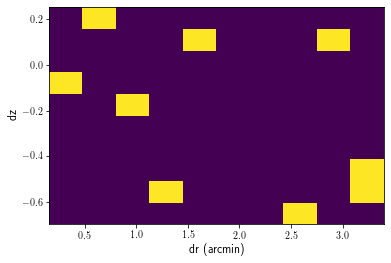

In [28]:
plt.xlabel('dr (arcmin)',fontsize=12)
plt.ylabel('dz',fontsize=12)
plt.hist2d(dr*60.,dz)
#plt.savefig('dzdr.png')

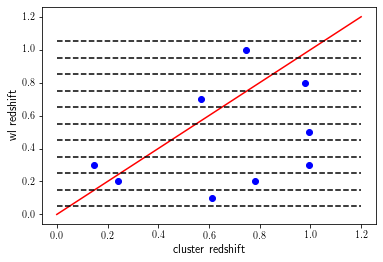

In [29]:
plt.scatter(zC[matches1['i1']],src[matches1['i2']]['z'],c='blue')
plt.plot(np.linspace(0,1.2,10),np.linspace(0,1.2,10),c='red',ls='-')
for izb in gridInfo.zlbound:
    plt.plot(np.linspace(0,1.2,10),izb*np.ones(10),c='black',ls='--')
plt.xlabel('cluster redshift',fontsize=12)
plt.ylabel('wl redshift',fontsize=12)
figname=os.path.join(figMsDir,'redshift_bias.png')
#plt.savefig(figname)

In [ ]:
# HSC galaxy
dzl=gridInfo.zlbound[1]-gridInfo.zlbound[0]
zlap=np.array([gridInfo.zlbound[-1]+dzl,gridInfo.zlbound[-1]+2*dzl,gridInfo.zlbound[-1]+3*dzl])
zlbin=np.hstack([gridInfo.zlbound,zlap])
x,y,z=cat['ra'],cat['dec'],cat['dnn_zbest']
weightOutTmp=numpy.histogramdd((z,y,x),bins=(zlbin,gridInfo.ybound,gridInfo.xbound))[0]
mask0=weightOutTmp>0. # the mask before smoothing
if gridInfo.sigma>0:
    # Gaussian Kernel in Fourier space (normalized in configuration space)
    gausKer=haloSim.GausAtom(ny=ny,nx=nx,sigma=gridInfo.sigma/gridInfo.delta,fou=True,lnorm=2.)
    norm=gausKer[0,0]
    gausKer/=norm
    # smothing with Gausian Kernel
    weightOut=np.fft.ifft2(np.fft.fft2(weightOutTmp)*gausKer).real
weightOut2=np.zeros((gridInfo.nzl,len(gridInfo.ybound)-1,len(gridInfo.xbound)-1))
for i in range(gridInfo.nzl):
    imin=max(i-1,0)
    imax=i+2
    num=0.
    for j in range(imin,imax):
        weightOut2[i]+=weightOut[j]
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_galMap.fits' %fieldname),weightOut2,overwrite=True)

In [89]:
from mayavi import mlab

In [91]:
mlab.contour3d(sparse3D.deltaR+0.0000001,contours=6, transparent=True)
#mlab.contour3d(data2,contours=1, transparent=True)
mlab.outline(extent=[0,sparse3D.nz,0,sparse3D.ny,0,sparse3D.nx])
mlab.show()